_____
# <p style="text-align: center;">__Customer Churn - Classification__<p>
_____

## __Step 1 - Importing Libraries and Data__

In [144]:
#Basics
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

#Train-Test Split
from sklearn.model_selection import train_test_split

#Models
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import GridSearchCV

#Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, confusion_matrix, classification_report

In [2]:
df=pd.read_csv("processed_dataset.csv")

In [3]:
df.head(5)

,id,Churn,Age,Gender,Dependents,Education,Marital_Status,Income_Category,Card_Category,Month_Vintage,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [4]:
#Setting the id columnt as index
df.set_index('id',inplace=True)

pd.set_option('display.max_columns', 50)

## __Step 2 - Basic Feature Eng. & Reference Modeling__

### _Step 2.1 - Basic Feature Eng. - One Hot Encoding_

There was no missing value as it was inspected in EDA file.

In [5]:
#Let's perform one-hot-encoding. For churn and gender, it is handled manually
df['Churn']=df['Churn'].map({'Existing Customer': 0, 'Attrited Customer':1})
df['Gender']=df['Gender'].map({'M':0, 'F': 1})

In [6]:
#For the other categorical columns, let use a function from my toolkit.

## One_Hot_Encoder works with:
    ## df: should be type of pandas.core.frame.DataFrame
    ## to_be_encoded: should be type of either one of the following ["pandas.core.indexes.base.Index","list","tuple"]

def One_Hot_Encoder(df,to_be_encoded):

    ### Input variable checks & errors

    wrong_column_name=[]
    
    if isinstance(df, pd.core.frame.DataFrame)==False:
        print("The first variable is not a pandas data frame, please enter a pandas data frame")
        return
    
    if len(df)==0:
        print("The data frame is empty, please check your data frame.")
        return
    
    if len(to_be_encoded)==0:
        print("The list of columns, to be encoded, is empty. Please check your list.")
        return
    
    for i in to_be_encoded:
        if i not in df.columns.tolist():
            wrong_column_name.append(i)
    
    if len(wrong_column_name)>0:
        if len(wrong_column_name)==1:
            print("There is no such a column as: {}".format(wrong_column_name))
        if len(wrong_column_name)>1:
            print("There are no columns as: {}".format(wrong_column_name))
        return
    
    ### N-1 Cluster Encoding to prevent dummy variable trap

    for i in to_be_encoded:
        dummies=pd.get_dummies(df[i],drop_first=True,prefix=i).astype(int)
        df=pd.concat([df,dummies],axis=1)
        df.drop(columns=i,inplace=True)
    
    print("encoded_df is prepared")
    return df

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10127 entries, 768805383 to 714337233
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Churn                     10127 non-null  int64  
 1   Age                       10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependents                10127 non-null  int64  
 4   Education                 10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Month_Vintage             10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14 

In [8]:
#To use the function above, first a list of columns to be encoded has to be prepared.
cols_to_be_encoded=df.select_dtypes(include=['object']).columns.tolist()
cols_to_be_encoded

['Education', 'Marital_Status', 'Income_Category', 'Card_Category']

In [9]:
df=One_Hot_Encoder(df,cols_to_be_encoded)
df

encoded_df is prepared


,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,45,0,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0
818770008,0,49,1,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
713982108,0,51,0,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
769911858,0,40,1,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0
709106358,0,40,0,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772366833,0,50,0,2,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
710638233,1,41,0,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
716506083,1,44,1,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0


### _Step 2.2 - Train-Test Split for Reference Model_

In [10]:
#To be able to perform a comparative evaluation fairly, I will split the ref_X into train val and test sets in a way-
#-that I will do for the improved dataset.

In [11]:
ref_X=df.drop(['Churn'],axis=1).copy()
ref_Y=df['Churn'].copy()

In [12]:
ref_X_train, ref_X_test, ref_y_train, ref_y_test = train_test_split(ref_X, ref_Y, test_size=0.2, stratify=ref_Y, random_state=42)
ref_X_train, ref_X_val, ref_y_train, ref_y_val = train_test_split(ref_X_train, ref_y_train, test_size=0.25, stratify=ref_y_train, random_state=42)

### _Step 2.3 - Reference Model_

In [13]:
ref_model = LogisticRegression(solver='liblinear')
ref_model.fit(ref_X_train,ref_y_train)
ref_y_pred = ref_model.predict(ref_X_test)

In [14]:
# Evaluating the reference model on Test Set
print("Accuracy Score of Reference Model on Test Data:",accuracy_score(ref_y_test,ref_y_pred))
print("\n")
print(classification_report(ref_y_test,ref_y_pred))

Accuracy Score of Reference Model on Test Data: 0.8884501480750246


              precision    recall  f1-score   support

           0       0.90      0.97      0.94      1701
           1       0.75      0.46      0.57       325

    accuracy                           0.89      2026
   macro avg       0.83      0.72      0.75      2026
weighted avg       0.88      0.89      0.88      2026



In [15]:
# Evaluating the reference model on Train Set
ref_y_pred_train=ref_model.predict(ref_X_train)
print("Accuracy Score of Reference Model on Train Data:",accuracy_score(ref_y_train,ref_y_pred_train))
print("\n")
print(classification_report(ref_y_train,ref_y_pred_train))

Accuracy Score of Reference Model on Train Data: 0.8941563786008231


              precision    recall  f1-score   support

           0       0.91      0.96      0.94      5099
           1       0.74      0.53      0.62       976

    accuracy                           0.89      6075
   macro avg       0.83      0.75      0.78      6075
weighted avg       0.89      0.89      0.89      6075



In [16]:
# Let's draw the feature importance graph with the absolute values of importance
ref_feature_importance = ref_model.coef_[0]
ref_feature_importance=np.abs(ref_feature_importance)
sorted_indices = np.argsort(ref_feature_importance)[::-1]
feature_names = ref_X.columns.tolist()
sorted_feature_names = [feature_names[i] for i in sorted_indices]
sorted_feature_importance = ref_feature_importance[sorted_indices]

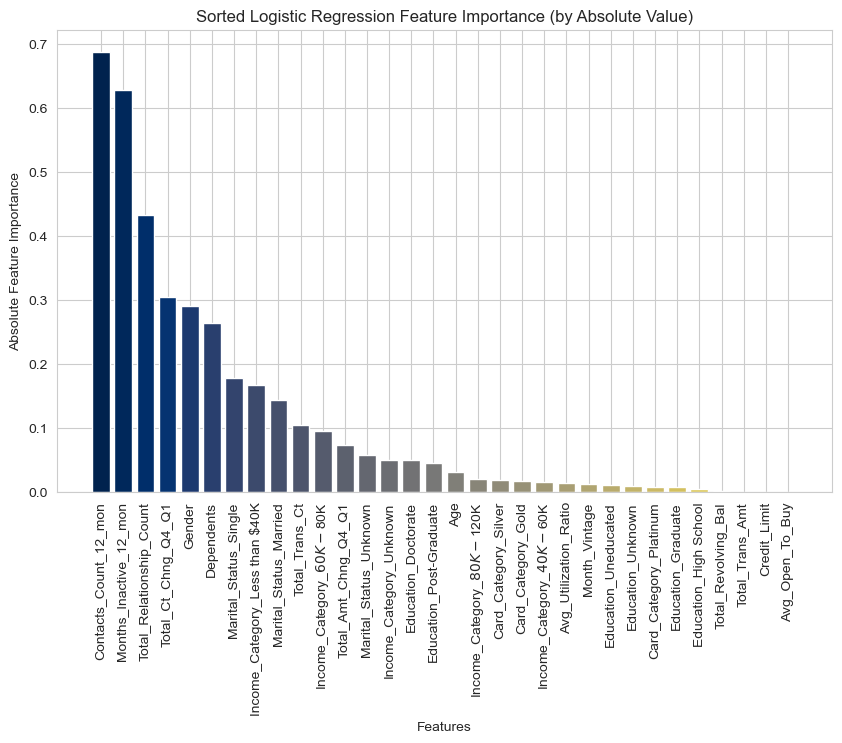

In [145]:
colors = plt.cm.cividis(np.linspace(0, 1, len(sorted_feature_importance)))
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importance)), sorted_feature_importance,color=colors)
plt.xticks(range(len(sorted_feature_importance)), sorted_feature_names, rotation=90)
plt.xlabel("Features")
plt.ylabel("Absolute Feature Importance")
plt.title("Sorted Logistic Regression Feature Importance (by Absolute Value)")
plt.savefig(os.path.join("Images", "Ref-Model-Feature-Importance.png"))
plt.show()

- We have almost 0.89 Accucary on both test and train dataset with this raw dataset. There is no variance(overfitting/underfitting) problem but we have a high bias.
- According to our reference (basic) model, it looks like "Contacts_Count_12_mon", "Months_Inactive_12_Mon", and "Total Relationship_Count" are the most important features.
- Following the selection of the optimal model and refining it through parameter tuning, we will assess the extent of our advancement compared to the reference model. My expectation is to decrease costs while maintaining control over variance.

## __Step 3 - Feature Engineering__

### _Step 3.1 - Multicollinearity Elimination_

<Axes: >

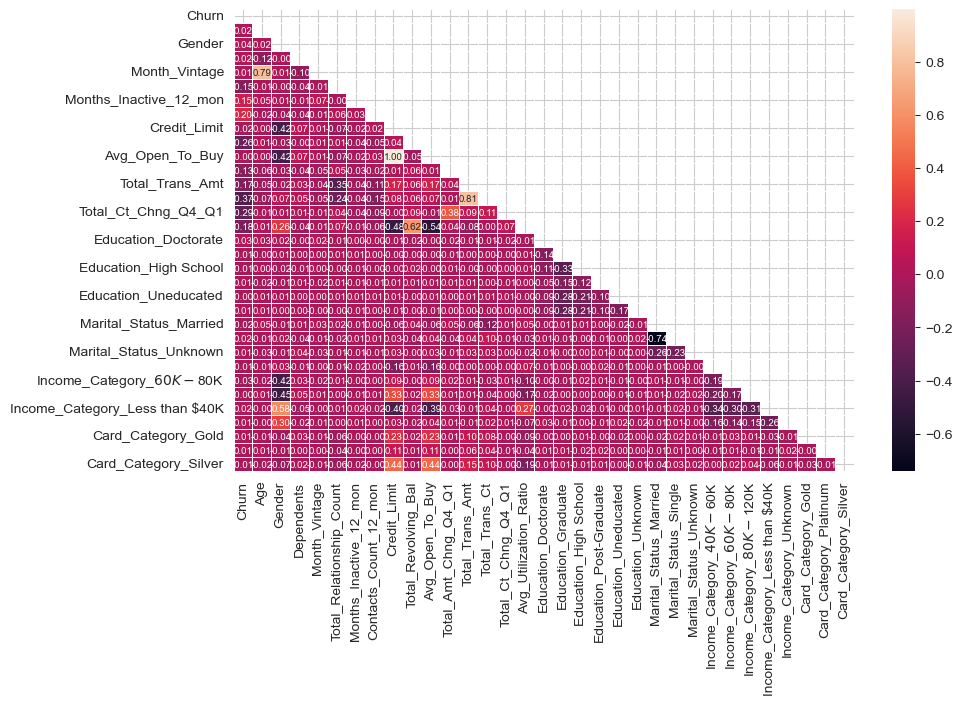

In [18]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
corr=df.corr(numeric_only=True)
threshold = 0.0
filtered_corr = corr[((corr >= threshold) | (corr <= -threshold)) & (corr != 1)]
below_triangle = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(data=filtered_corr,annot=True,fmt=".02f",linewidth=.5,mask=below_triangle,annot_kws={"fontsize": 7})

<Axes: >

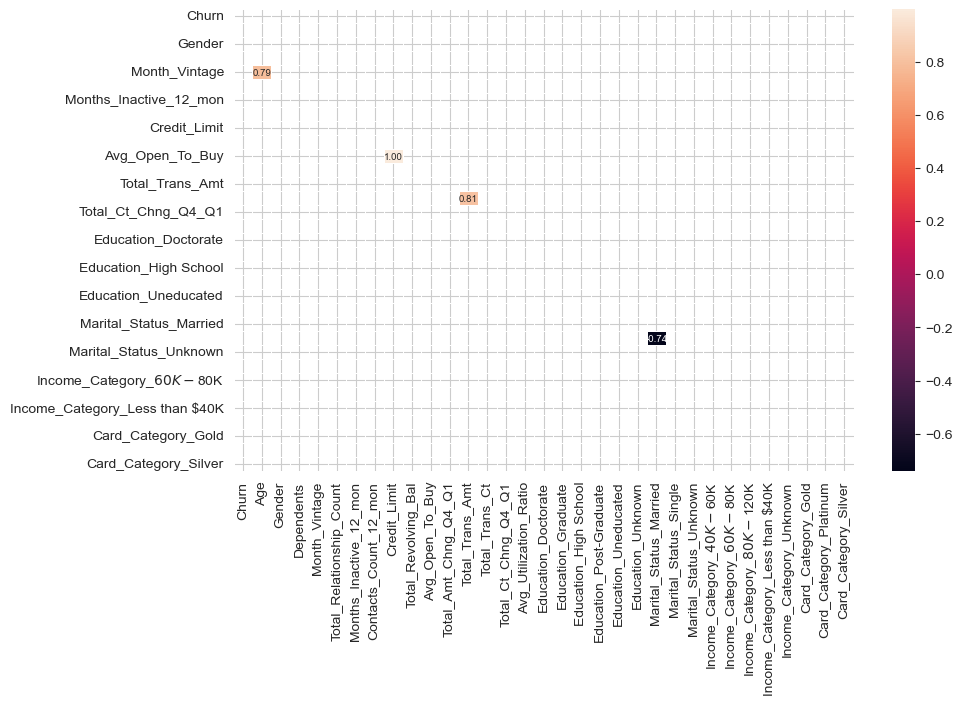

In [19]:
#Let's only see the correlations above 0.7
plt.figure(figsize=(10,6))
corr=df.corr(numeric_only=True)
threshold = 0.7
filtered_corr = corr[((corr >= threshold) | (corr <= -threshold)) & (corr != 1)]
below_triangle = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(data=filtered_corr,annot=True,fmt=".02f",linewidth=.5,mask=below_triangle,annot_kws={"fontsize": 7})

- Martial Status Married and Martial Status Single have 0.74 correlation
- Total Trans Amount and Total Trans Ct have 0.81 correlation
- Monthly Vintage and Age have 0.79 correlation
- Avr Open to Buy and Credit Limit have 1.00 correlation

In [20]:
#Let's drop one of the correlated columns
#However I want to keep the Month_Vintage-Age and Martial Status duos.
df.drop(columns=['Avg_Open_To_Buy','Total_Trans_Amt'],inplace=True)

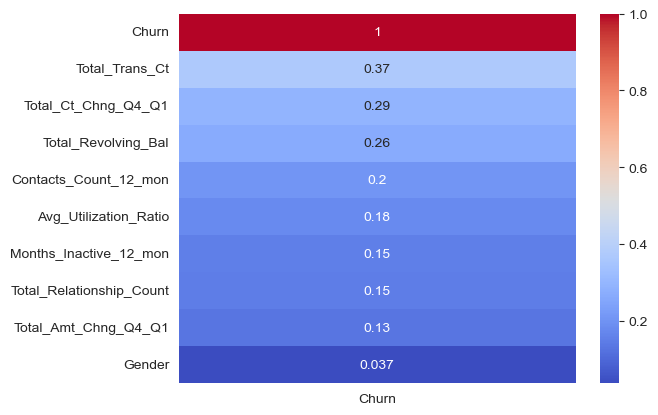

In [21]:
#Let's see the top ten mostly correlated features with Churn.
#Note that these are absolute correlation numbers to see the rank.
correlation_matrix = df.corr()
correlation_with_was_delayed = correlation_matrix['Churn'].abs().sort_values(ascending=False).head(10)
sns.heatmap(correlation_with_was_delayed.to_frame(), annot=True, cmap="coolwarm")
plt.show()

### _Step 3.2 - Feature Extraction_

In [22]:
# One new feature could be added to see the frequency of contacts 
# of the customers by dividing contact count number in the last 12 months by
# the customers active months

df['Contact_Freq']=df['Contacts_Count_12_mon']/(12-df['Months_Inactive_12_mon'])

In [23]:
df.head(5)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,45,0,3,39,5,1,3,12691.0,777,1.335,42,1.625,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,49,1,5,44,6,1,2,8256.0,864,1.541,33,3.714,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818
713982108,0,51,0,3,36,4,1,0,3418.0,0,2.594,20,2.333,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0.000000
769911858,0,40,1,4,34,3,4,1,3313.0,2517,1.405,20,2.333,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0.125000
709106358,0,40,0,3,21,5,1,0,4716.0,0,2.175,28,2.500,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0.000000


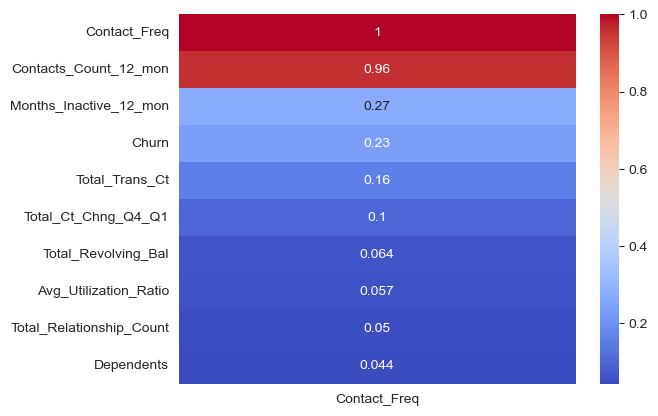

In [24]:
#Let's whether the feature is correlated with churn or not
correlation_matrix = df.corr()
correlation_with_was_delayed = correlation_matrix['Contact_Freq'].abs().sort_values(ascending=False).head(10)
sns.heatmap(correlation_with_was_delayed.to_frame(), annot=True, cmap="coolwarm")
plt.show()

In [25]:
# the correlation btw contacts_count_12_mon with churn is 0.2 while it is 0.23
# between churn and Contact Freq. It would be not logical to use both Contact Freq and
# contacts_count_12_mon together because of the high correlation of them.
# so lets create an alternative dataset to try both of them with the algorithm.

df_featured = df.drop('Contacts_Count_12_mon',axis=1).copy()
df.drop('Contact_Freq',axis=1,inplace=True)

### _Step 3.3 - Scaling_

In [26]:
#To scale the dataframe let me use a function from my toolkit

## Scaler works with:
    ## df: should be type of pandas.core.frame.DataFrame
    ## to_be_encoded: should be type of either of the following ["pandas.core.indexes.base.Index","list","tuple"]

def Scaler(df,to_be_scaled,t="n"):
    
    # Input variable checks & errors

    wrong_column_name=[]

    if isinstance(df, pd.core.frame.DataFrame)==False:
        print("The first variable is not a pandas data frame, please enter a pandas data frame")
        return
    
    if len(df)==0:
        print("The data frame is empty, please check your data frame.")
        return
    
    if len(to_be_scaled)==0:
        print("The list of columns, to be scaled, is empty. Please check your list.")
        return
    
    for i in to_be_scaled:
        if i not in df.columns.tolist():
            wrong_column_name.append(i)
    
    if len(wrong_column_name)>0:
        if len(wrong_column_name)==1:
            print("There is no such a column as: {}".format(wrong_column_name))
        if len(wrong_column_name)>1:
            print("There are no columns as: {}".format(wrong_column_name))
        return
    
    if t.lower()!="n" and t.lower()!="s" and t.lower()!="rs":
        print("Please put the third input as N, S or RS for Normalization, Standardization and Robust Scaler respectively")
        return

    # Importing necessary models
    
    from sklearn.preprocessing import StandardScaler
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.preprocessing import RobustScaler

    # Scaling
    
    new_df=df.copy()

    if t.lower()=="n":
        model=MinMaxScaler()
        for i in to_be_scaled:
            new_df[i]=model.fit_transform(new_df[[i]])
        print("Normalized df is prepared")
    
    elif t.lower()=="rs":
        model=RobustScaler()
        for i in to_be_scaled:
            new_df[i]=model.fit_transform(new_df[[i]])
        print("Robust Scaled df is prepared")

    else:
        model=StandardScaler()
        for i in to_be_scaled:
            new_df[i]=model.fit_transform(new_df[[i]])
        print("Standardized df is prepared")

    return new_df

In [27]:
df.head(5)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,45,0,3,39,5,1,3,12691.0,777,1.335,42,1.625,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0
818770008,0,49,1,5,44,6,1,2,8256.0,864,1.541,33,3.714,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
713982108,0,51,0,3,36,4,1,0,3418.0,0,2.594,20,2.333,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
769911858,0,40,1,4,34,3,4,1,3313.0,2517,1.405,20,2.333,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0
709106358,0,40,0,3,21,5,1,0,4716.0,0,2.175,28,2.500,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0


In [28]:
# 1/0 columns do not need to be scaled
cols_to_be_scaled=['Age','Dependents','Total_Relationship_Count','Months_Inactive_12_mon',
                   'Contacts_Count_12_mon','Credit_Limit','Total_Revolving_Bal',
                   'Total_Amt_Chng_Q4_Q1','Total_Trans_Ct','Total_Ct_Chng_Q4_Q1','Month_Vintage']

In [29]:
# Let's perform normalization (Min-Max Scaling)
df_n=Scaler(df,cols_to_be_scaled,'n')

Normalized df is prepared


In [30]:
df_n.head(5)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,0.404255,0,0.6,0.604651,0.8,0.166667,0.500000,0.340190,0.308701,0.392994,0.248062,0.437534,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0
818770008,0,0.489362,1,1.0,0.720930,1.0,0.166667,0.333333,0.206112,0.343266,0.453636,0.178295,1.000000,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
713982108,0,0.531915,0,0.6,0.534884,0.6,0.166667,0.000000,0.059850,0.000000,0.763615,0.077519,0.628164,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
769911858,0,0.297872,1,0.8,0.488372,0.4,0.666667,0.166667,0.056676,1.000000,0.413600,0.077519,0.628164,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0
709106358,0,0.297872,0,0.6,0.186047,0.8,0.166667,0.000000,0.099091,0.000000,0.640271,0.139535,0.673129,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0


## __Step 4 - Model Selection__

### _Step 4.1 - Train-Test Split_

In [31]:
# As a first step the model will be selected, with the normalized and encoded data frame.

In [32]:
X=df_n.drop(['Churn'],axis=1).copy()
Y=df_n['Churn'].copy()

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

### _Step 4.2 - Models_

In [34]:
# Let's compare 19 models to see which one gives the best result

In [35]:
#Let's train the ready models
models = [
    ("Logistic Regression", LogisticRegression()),
    ("Random Forest", RandomForestClassifier()),
    ("Gradient Boosting", GradientBoostingClassifier()),
    ("AdaBoost", AdaBoostClassifier()),
    ("SVM", SVC()),
    ("Decision Tree", DecisionTreeClassifier()),
    ("Naive Bayes", GaussianNB()),
    ("K-Nearest Neighbors", KNeighborsClassifier()),
    ("Quadratic Discriminant Analysis", QuadraticDiscriminantAnalysis()),
    ("Extra Trees", ExtraTreesClassifier()),
    ("Bagging Classifier", BaggingClassifier()),
    ("Passive Aggressive", PassiveAggressiveClassifier()),
    ("Perceptron", Perceptron()),
    ("Ridge Classifier", RidgeClassifier()),
    ("SGD Classifier", SGDClassifier()),
    ("Calibrated Classifier", CalibratedClassifierCV()),
    ("XGBoost", XGBClassifier()),
    ("LightGBM", LGBMClassifier()),
    ("CatBoost", CatBoostClassifier())
]

# Creating a data frame to hold the accuracy scores and confusion matrices
results = []

# Training each model and recording the results of validation dataset
for model_name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    accuracy = accuracy_score(y_val, y_pred)
    report = classification_report(y_val, y_pred, output_dict=True)
    results.append((model_name, accuracy, report))

c:\Users\Asus\anaconda3\Lib\site-packages\xgboost\data.py:335: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
c:\Users\Asus\anaconda3\Lib\site-packages\xgboost\data.py:338: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  is_categorical_dtype(dtype) or is_pa_ext_categorical_dtype(dtype)
c:\Users\Asus\anaconda3\Lib\site-packages\xgboost\data.py:384: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(dtype):
c:\Users\Asus\anaconda3\Lib\site-packages\xgboost\data.py:359: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  return is_int or is_bool or is_float or is_categorical_dtype(dtype)
c:\Us

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1542
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337
Learning rate set to 0.022259
0:	learn: 0.6639879	total: 202ms	remaining: 3m 22s
1:	learn: 0.6347909	total: 211ms	remaining: 1m 45s
2:	learn: 0.6094185	total: 221ms	remaining: 1m 13s
3:	learn: 0.5818591	total: 228ms	remaining: 56.8s
4:	learn: 0.5587716	total: 233ms	remaining: 46.4s
5:	learn: 0.5356611	total: 240ms	remaining: 39.7s
6:	learn: 0.5161495	total: 245ms	

In [36]:
# Sorting the results by accuracy
results.sort(key=lambda x: x[1], reverse=True)
top_models = results[:5]

# Printing the top models and their accuracy scores
print("Top 5 Models' Metrics:")
top_models_df = pd.DataFrame(top_models, columns=["Model", "Accuracy", "Classification Report"])
top_models_df.drop(columns=["Classification Report"], inplace=True)
print(top_models_df)

# Printing the classification reports separately
print("\nClassification Reports:")
print("\n")
for model_name, _, report in top_models:
    report_dict = report
    report_df = pd.DataFrame(report_dict).transpose()
    print(f"{model_name} Classification Report:")
    print(report_df)
    print("\n")

Top 5 Models' Metrics:
               Model  Accuracy
0           LightGBM  0.937315
1            XGBoost  0.935834
2           CatBoost  0.935834
3  Gradient Boosting  0.933860
4      Random Forest  0.923988

Classification Reports:


LightGBM Classification Report:
              precision    recall  f1-score      support
0              0.953314  0.972941  0.963028  1700.000000
1              0.841924  0.751534  0.794165   326.000000
accuracy       0.937315  0.937315  0.937315     0.937315
macro avg      0.897619  0.862237  0.878596  2026.000000
weighted avg   0.935391  0.937315  0.935856  2026.000000


XGBoost Classification Report:
              precision    recall  f1-score      support
0              0.952710  0.971765  0.962143  1700.000000
1              0.835616  0.748466  0.789644   326.000000
accuracy       0.935834  0.935834  0.935834     0.935834
macro avg      0.894163  0.860115  0.875894  2026.000000
weighted avg   0.933869  0.935834  0.934387  2026.000000


CatBoost Clas

In [37]:
# According to the results, all the top 5 models are decision tree models.
# We will go with LightGBM as it is the winner with a difference of 0.2%
# Also LightGBM has a better on predicting both Churn and not Churn 

## __Step 5 - Dataset Selection__

### _Step 5.1 - Dataset_1 / Scaled & Encoded_

#### _Step 5.1.1 - Dataset_1 / Normal Dataset (Normalized & Encoded)_

In [38]:
df_n.head(5)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,0.404255,0,0.6,0.604651,0.8,0.166667,0.500000,0.340190,0.308701,0.392994,0.248062,0.437534,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0
818770008,0,0.489362,1,1.0,0.720930,1.0,0.166667,0.333333,0.206112,0.343266,0.453636,0.178295,1.000000,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
713982108,0,0.531915,0,0.6,0.534884,0.6,0.166667,0.000000,0.059850,0.000000,0.763615,0.077519,0.628164,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
769911858,0,0.297872,1,0.8,0.488372,0.4,0.666667,0.166667,0.056676,1.000000,0.413600,0.077519,0.628164,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0
709106358,0,0.297872,0,0.6,0.186047,0.8,0.166667,0.000000,0.099091,0.000000,0.640271,0.139535,0.673129,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0


In [39]:
# Let's use lightgbm model, but first train-val-test split.
X=df_n.drop(['Churn'],axis=1).copy()
Y=df_n['Churn'].copy()

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [41]:
# Not to have a problem of imbalanced calculation, we need to avoid skewed dataset.
print(f'Churn portion of Train set: {y_train.sum()/len(y_train)}')
print(f'Churn portion of Val set: {y_val.sum()/len(y_val)}')
print(f'Churn portion of Test set: {y_test.sum()/len(y_test)}')

Churn portion of Train set: 0.16065843621399176
Churn portion of Val set: 0.16090819348469892
Churn portion of Test set: 0.16041461006910168


In [42]:
model_1=LGBMClassifier()
model_1.fit(X_train,y_train)
y_pred = model_1.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1542
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.937314906219151

In [43]:
#Creating a table dataframe to hold the scores of datasets
Acc_Table=pd.DataFrame(columns=['Dataset','Accuracy Score'])

In [44]:
new_row = pd.DataFrame({'Dataset': ['Normalized-Encoded'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

C:\Users\Asus\AppData\Local\Temp\ipykernel_7564\1031975616.py:2: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)


,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315


#### _Step 5.1.2 - Dataset_1 / Normal Dataset (Standardized & Encoded)_

In [45]:
df_s=Scaler(df,cols_to_be_scaled,'s')

Standardized df is prepared


In [46]:
# Let's use lightgbm model, but first train-val-test split.
X=df_s.drop(['Churn'],axis=1).copy()
Y=df_s['Churn'].copy()

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [48]:
model=LGBMClassifier()
model.fit(X_train,y_train)
y_pred = model.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1549
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9397828232971372

In [49]:
new_row = pd.DataFrame({'Dataset': ['Standardized-Encoded'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783


#### _Step 5.1.3 - Dataset_1 / Normal Dataset (Not Scaled & Encoded)_

In [50]:
# Let's use lightgbm model, but first train-val-test split.
X=df.drop(['Churn'],axis=1).copy()
Y=df['Churn'].copy()

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [52]:
model=LGBMClassifier()
model.fit(X_train,y_train)
y_pred = model.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1546
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9353405725567621

In [53]:
new_row = pd.DataFrame({'Dataset': ['NotScaled-Encoded'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341


### _Step 5.2 - Dataset_2 / Featured Dataset (Scaled & Encoded & Featured)_

#### _Step 5.2.1 - Dataset_2 / Featured Dataset (Normalized & Encoded & Featured)_

In [54]:
# We have prepared a dataset called df_featured where we add a new feature
# indicating the contact number frequency and dropped the contact number feature
# because of high correlation btw them.

# Now this dataset will be used.

In [55]:
df_featured.head(5)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,45,0,3,39,5,1,12691.0,777,1.335,42,1.625,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,49,1,5,44,6,1,8256.0,864,1.541,33,3.714,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818
713982108,0,51,0,3,36,4,1,3418.0,0,2.594,20,2.333,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0.000000
769911858,0,40,1,4,34,3,4,3313.0,2517,1.405,20,2.333,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0.125000
709106358,0,40,0,3,21,5,1,4716.0,0,2.175,28,2.500,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0.000000


In [56]:
cols_to_be_scaled_featured=cols_to_be_scaled.copy()
cols_to_be_scaled_featured.remove('Contacts_Count_12_mon')
cols_to_be_scaled

['Age',
 'Dependents',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Month_Vintage']

In [57]:
df_featured_n=Scaler(df_featured,cols_to_be_scaled_featured,'n')

Normalized df is prepared


In [58]:
df_featured_n.head(2)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,0.404255,0,0.6,0.604651,0.8,0.166667,0.340190,0.308701,0.392994,0.248062,0.437534,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,0.489362,1,1.0,0.720930,1.0,0.166667,0.206112,0.343266,0.453636,0.178295,1.000000,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818


In [59]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured_n.drop(['Churn'],axis=1).copy()
Y=df_featured_n['Churn'].copy()

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [61]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1565
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9368213228035538

In [62]:
new_row = pd.DataFrame({'Dataset': ['Featured-Normalized-Encoded'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341
3,Featured-Normalized-Encoded,0.936821


#### _Step 5.2.2 - Dataset_2 / Featured Dataset (Standardized & Encoded & Featured)_

In [63]:
df_featured_s=Scaler(df_featured,cols_to_be_scaled_featured,'s')

Standardized df is prepared


In [64]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured_s.drop(['Churn'],axis=1).copy()
Y=df_featured_s['Churn'].copy()

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [66]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1571
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9397828232971372

In [67]:
df_featured_s.head(2)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,-0.165406,0,0.503368,0.384621,0.763943,-1.327136,0.446622,-0.473422,2.623494,-0.973895,3.834003,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,0.333570,1,2.043199,1.010715,1.407306,-1.327136,-0.041367,-0.366667,3.563293,-1.357340,12.608573,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818


In [68]:
new_row = pd.DataFrame({'Dataset': ['Featured-Standardized-Encoded'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341
3,Featured-Normalized-Encoded,0.936821
4,Featured-Standardized-Encoded,0.939783


#### _Step 5.2.3 - Dataset_2 / Featured Dataset (NotScaled & Encoded & Featured)_

In [69]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured.drop(['Churn'],axis=1).copy()
Y=df_featured['Churn'].copy()

In [70]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [71]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1569
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.93928923988154

In [72]:
new_row = pd.DataFrame({'Dataset': ['Featured-NotScaled-Encoded'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341
3,Featured-Normalized-Encoded,0.936821
4,Featured-Standardized-Encoded,0.939783
5,Featured-NotScaled-Encoded,0.939289


- Its can be seen from the Accuracy table that standardized datasets gave better results
- There is not much difference between featured and normal dataset.
- I will keep going with the Featured dataset as it is more meaningful by the nature of the feature extracted
- I will keep going with the standardization scaling method where every mean(x) is substracted from x and divided by standard deviation

### _Step 5.3 - Dataset_3 / Transformed (Featured & Standardized & Encoded & Transformed)_

#### _Step 5.3.1 - Dataset_3 / Logged (Featured & Standardized & Encoded & Logged)_

In [73]:
#Let's try to apply a transformation on credit limit variable to see if it works
#if it works then we may apply the same transformation on other right skewed variables.

In [74]:
df_featured.head(1)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,45,0,3,39,5,1,12691.0,777,1.335,42,1.625,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727


Text(0.5, 1.0, 'Original Credit Limit Distribution')

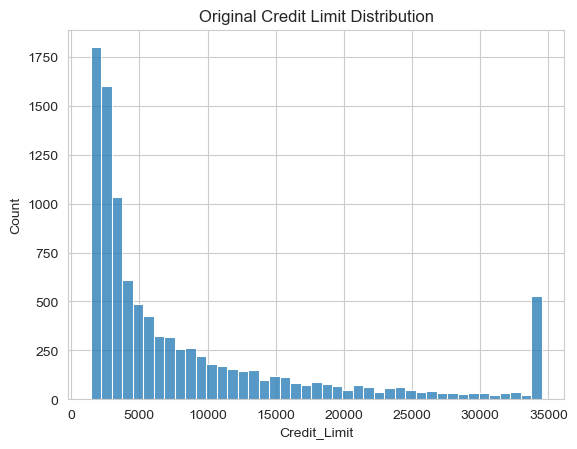

In [75]:
sns.histplot(data=df_featured,x='Credit_Limit')
plt.title('Original Credit Limit Distribution')

Text(0.5, 1.0, 'Log100(x) Credit Limit Distribution')

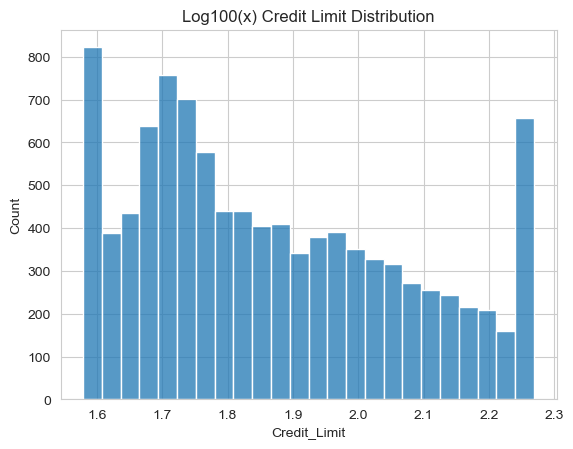

In [76]:
sns.histplot(x=df_featured['Credit_Limit'].apply(lambda x: np.log(x)/np.log(100)))
plt.title('Log100(x) Credit Limit Distribution')

In [77]:
df_featured.head(5)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,45,0,3,39,5,1,12691.0,777,1.335,42,1.625,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,49,1,5,44,6,1,8256.0,864,1.541,33,3.714,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818
713982108,0,51,0,3,36,4,1,3418.0,0,2.594,20,2.333,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0.000000
769911858,0,40,1,4,34,3,4,3313.0,2517,1.405,20,2.333,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0.125000
709106358,0,40,0,3,21,5,1,4716.0,0,2.175,28,2.500,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0.000000


In [78]:
df_featured_logged=df_featured.copy()
df_featured_logged['Credit_Limit']=df_featured_logged['Credit_Limit'].apply(lambda x: np.log(x)/np.log(100))
df_featured_logged.head(5)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,45,0,3,39,5,1,2.051748,777,1.335,42,1.625,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,49,1,5,44,6,1,1.958385,864,1.541,33,3.714,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818
713982108,0,51,0,3,36,4,1,1.766886,0,2.594,20,2.333,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0.000000
769911858,0,40,1,4,34,3,4,1.760111,2517,1.405,20,2.333,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0.125000
709106358,0,40,0,3,21,5,1,1.836787,0,2.175,28,2.500,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0.000000


In [79]:
cols_to_be_scaled_featured_log=cols_to_be_scaled_featured.copy()
cols_to_be_scaled_featured_log.remove('Credit_Limit')
df_featured_logged_s=Scaler(df_featured_logged,cols_to_be_scaled_featured_log,'s')

Standardized df is prepared


In [80]:
df_featured_logged_s.head(2)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,-0.165406,0,0.503368,0.384621,0.763943,-1.327136,2.051748,-0.473422,2.623494,-0.973895,3.834003,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,0.333570,1,2.043199,1.010715,1.407306,-1.327136,1.958385,-0.366667,3.563293,-1.357340,12.608573,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818


In [81]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured_logged_s.drop(['Churn'],axis=1).copy()
Y=df_featured_logged_s['Churn'].copy()

In [82]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [83]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1571
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9387956564659428

In [84]:
new_row = pd.DataFrame({'Dataset': ['Logged-Featured-Standardized-Encoded'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341
3,Featured-Normalized-Encoded,0.936821
4,Featured-Standardized-Encoded,0.939783
5,Featured-NotScaled-Encoded,0.939289
6,Logged-Featured-Standardized-Encoded,0.938796


- Log transformation on Credit_Limit feature has decreased the the accuracy

#### _Step 5.3.2 - Dataset_3 / Reciprocal (Featured & Standardized & Encoded & Reciprocal)_

Text(0.5, 1.0, '1/x**(1/5) Credit Limit Distribution')

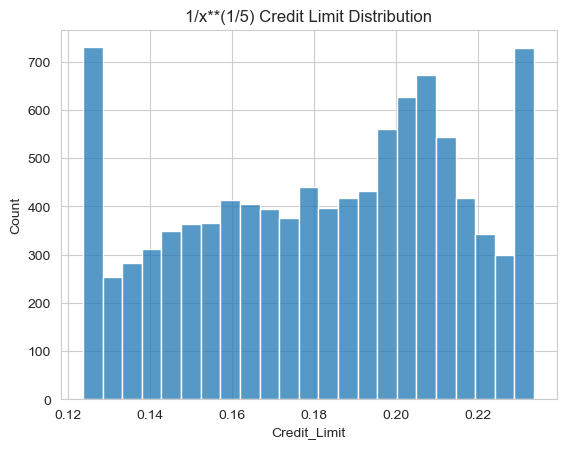

In [85]:
sns.histplot(x=df_featured['Credit_Limit'].apply(lambda x: 1/x**(1/5)))
plt.title('1/x**(1/5) Credit Limit Distribution')

In [86]:
df_featured_rec=df_featured.copy()
df_featured_rec['Credit_Limit']=1/df_featured_rec['Credit_Limit']**(1/5)
df_featured_rec.head(5)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,45,0,3,39,5,1,0.151113,777,1.335,42,1.625,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,49,1,5,44,6,1,0.164682,864,1.541,33,3.714,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818
713982108,0,51,0,3,36,4,1,0.196447,0,2.594,20,2.333,0.000,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0.000000
769911858,0,40,1,4,34,3,4,0.197677,2517,1.405,20,2.333,0.760,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0.125000
709106358,0,40,0,3,21,5,1,0.184198,0,2.175,28,2.500,0.000,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0.000000


In [87]:
cols_to_be_scaled_featured_log=cols_to_be_scaled_featured.copy()
cols_to_be_scaled_featured_log.remove('Credit_Limit')
df_featured_rec_s=Scaler(df_featured_rec,cols_to_be_scaled_featured_log,'s')

Standardized df is prepared


In [88]:
df_featured_rec_s.head(2)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,-0.165406,0,0.503368,0.384621,0.763943,-1.327136,0.151113,-0.473422,2.623494,-0.973895,3.834003,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,0.333570,1,2.043199,1.010715,1.407306,-1.327136,0.164682,-0.366667,3.563293,-1.357340,12.608573,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818


In [89]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured_rec_s.drop(['Churn'],axis=1).copy()
Y=df_featured_rec_s['Churn'].copy()

In [90]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [91]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1571
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.937314906219151

In [92]:
new_row = pd.DataFrame({'Dataset': ['Reciprocal-Featured-Standardized-Encoded'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341
3,Featured-Normalized-Encoded,0.936821
4,Featured-Standardized-Encoded,0.939783
5,Featured-NotScaled-Encoded,0.939289
6,Logged-Featured-Standardized-Encoded,0.938796
7,Reciprocal-Featured-Standardized-Encoded,0.937315


## __Step 6 - Feature Selection__

### _Step 6.1 - Round 1 - Without Card Type_

In [93]:
# In step 6, feature selection stage will be performed on Featured & Standardized & Encoded Dataset.

In [94]:
df_featured_s.head(2)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,-0.165406,0,0.503368,0.384621,0.763943,-1.327136,0.446622,-0.473422,2.623494,-0.973895,3.834003,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,0.333570,1,2.043199,1.010715,1.407306,-1.327136,-0.041367,-0.366667,3.563293,-1.357340,12.608573,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0.181818


In [95]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured_s.drop(['Churn'],axis=1).copy()
Y=df_featured_s['Churn'].copy()

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [97]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1571
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9397828232971372

C:\Users\Asus\AppData\Local\Temp\ipykernel_7564\2879600126.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='AbsImportance', y='Feature', data=feature_importance_df, palette='viridis')
C:\Users\Asus\AppData\Local\Temp\ipykernel_7564\2879600126.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')


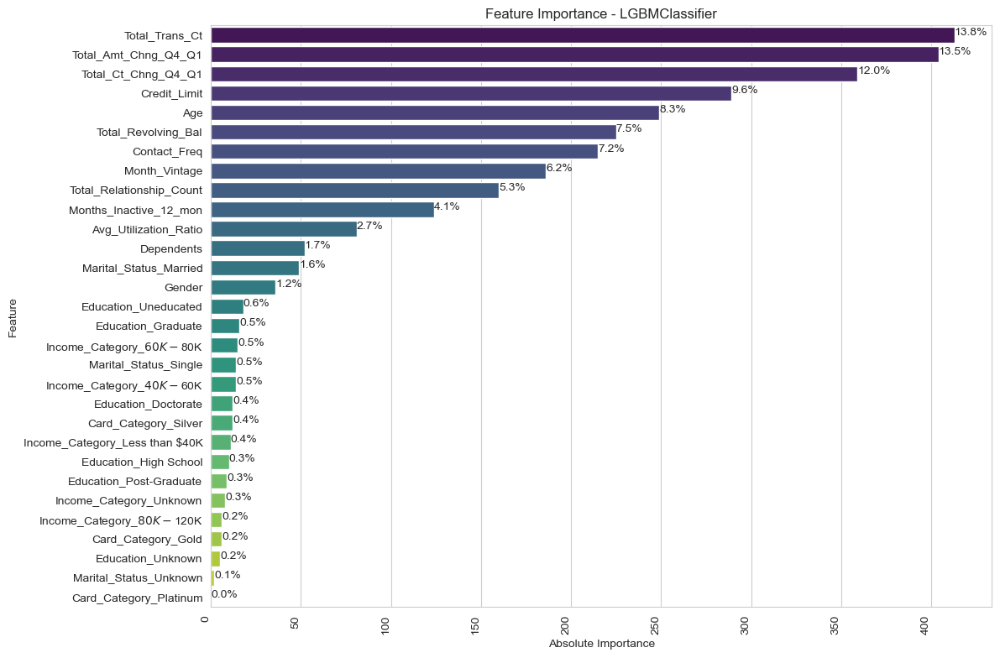

In [98]:
feature_importances = model_2.feature_importances_
feature_names = X_train.columns
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})
feature_importance_df['AbsImportance'] = np.abs(feature_importance_df['Importance'])
feature_importance_df = feature_importance_df.sort_values(by='AbsImportance', ascending=False)



plt.figure(figsize=(12, 9))
ax = sns.barplot(x='AbsImportance', y='Feature', data=feature_importance_df, palette='viridis')
ax.set_xlabel('Absolute Importance')
ax.set_title('Feature Importance - LGBMClassifier')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_width() / feature_importance_df['AbsImportance'].sum())
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height() / 2
    ax.annotate(percentage, (x, y), ha='left')

plt.show()

In [99]:
# Gathering the column names except card category columns

without_card=[]
for col in df_featured_s.columns.tolist():
    if 'card' not in col.lower():
        without_card.append(col)

without_card

['Churn',
 'Age',
 'Gender',
 'Dependents',
 'Month_Vintage',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Education_Doctorate',
 'Education_Graduate',
 'Education_High School',
 'Education_Post-Graduate',
 'Education_Uneducated',
 'Education_Unknown',
 'Marital_Status_Married',
 'Marital_Status_Single',
 'Marital_Status_Unknown',
 'Income_Category_$40K - $60K',
 'Income_Category_$60K - $80K',
 'Income_Category_$80K - $120K',
 'Income_Category_Less than $40K',
 'Income_Category_Unknown',
 'Contact_Freq']

In [100]:
df_featured_s[without_card].head(2)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Education_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,-0.165406,0,0.503368,0.384621,0.763943,-1.327136,0.446622,-0.473422,2.623494,-0.973895,3.834003,0.061,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0.272727
818770008,0,0.333570,1,2.043199,1.010715,1.407306,-1.327136,-0.041367,-0.366667,3.563293,-1.357340,12.608573,0.105,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0.181818


In [101]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured_s[without_card].drop(['Churn'],axis=1).copy()
Y=df_featured_s[without_card]['Churn'].copy()

In [102]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [103]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1567
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9387956564659428

In [104]:
new_row = pd.DataFrame({'Dataset': ['Without Card Cat'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341
3,Featured-Normalized-Encoded,0.936821
4,Featured-Standardized-Encoded,0.939783
5,Featured-NotScaled-Encoded,0.939289
6,Logged-Featured-Standardized-Encoded,0.938796
7,Reciprocal-Featured-Standardized-Encoded,0.937315
8,Without Card Cat,0.938796


In [105]:
# The accuracy is still below the best accuracy ,0.939783, by 0.1% percent.

### _Step 6.2 - Round 2 - Without Education Category_

In [106]:
# Gathering the column names except education category columns

without_edu=[]
for col in df_featured_s.columns.tolist():
    if 'education' not in col.lower():
        without_edu.append(col)

without_edu

['Churn',
 'Age',
 'Gender',
 'Dependents',
 'Month_Vintage',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Marital_Status_Married',
 'Marital_Status_Single',
 'Marital_Status_Unknown',
 'Income_Category_$40K - $60K',
 'Income_Category_$60K - $80K',
 'Income_Category_$80K - $120K',
 'Income_Category_Less than $40K',
 'Income_Category_Unknown',
 'Card_Category_Gold',
 'Card_Category_Platinum',
 'Card_Category_Silver',
 'Contact_Freq']

In [107]:
df_featured_s[without_edu].head(2)

,Churn,Age,Gender,Dependents,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Contact_Freq
id,,,,,,,,,,,,,,,,,,,,,,,,,
768805383,0,-0.165406,0,0.503368,0.384621,0.763943,-1.327136,0.446622,-0.473422,2.623494,-0.973895,3.834003,0.061,1,0,0,0,1,0,0,0,0,0,0,0.272727
818770008,0,0.333570,1,2.043199,1.010715,1.407306,-1.327136,-0.041367,-0.366667,3.563293,-1.357340,12.608573,0.105,0,1,0,0,0,0,1,0,0,0,0,0.181818


In [108]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured_s[without_edu].drop(['Churn'],axis=1).copy()
Y=df_featured_s[without_edu]['Churn'].copy()

In [109]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [110]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1559
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9387956564659428

In [111]:
new_row = pd.DataFrame({'Dataset': ['Without Education Cat'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341
3,Featured-Normalized-Encoded,0.936821
4,Featured-Standardized-Encoded,0.939783
5,Featured-NotScaled-Encoded,0.939289
6,Logged-Featured-Standardized-Encoded,0.938796
7,Reciprocal-Featured-Standardized-Encoded,0.937315
8,Without Card Cat,0.938796
9,Without Education Cat,0.938796


### _Step 6.3 - Round 3 - Without Income Category_

In [112]:
# Gathering the column names except income category columns

without_income=[]
for col in df_featured_s.columns.tolist():
    if 'income' not in col.lower():
        without_income.append(col)

without_income

['Churn',
 'Age',
 'Gender',
 'Dependents',
 'Month_Vintage',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Education_Doctorate',
 'Education_Graduate',
 'Education_High School',
 'Education_Post-Graduate',
 'Education_Uneducated',
 'Education_Unknown',
 'Marital_Status_Married',
 'Marital_Status_Single',
 'Marital_Status_Unknown',
 'Card_Category_Gold',
 'Card_Category_Platinum',
 'Card_Category_Silver',
 'Contact_Freq']

In [113]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured_s[without_income].drop(['Churn'],axis=1).copy()
Y=df_featured_s[without_income]['Churn'].copy()

In [114]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [115]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1561
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.93928923988154

In [116]:
new_row = pd.DataFrame({'Dataset': ['Without Income Cat'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341
3,Featured-Normalized-Encoded,0.936821
4,Featured-Standardized-Encoded,0.939783
5,Featured-NotScaled-Encoded,0.939289
6,Logged-Featured-Standardized-Encoded,0.938796
7,Reciprocal-Featured-Standardized-Encoded,0.937315
8,Without Card Cat,0.938796
9,Without Education Cat,0.938796


### _Step 6.4 - Round 4 - Without all features below 1% of importance_

In [117]:
# Gathering the column names except having importance above 1%

above_1=[]
for col in feature_importance_df['Feature'].tolist():
    if feature_importance_df.loc[feature_importance_df['Feature']==col,'Importance'].iloc[0] > feature_importance_df['Importance'].sum()/100:
        above_1.append(col)

above_1.append('Churn')
above_1

['Total_Trans_Ct',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Ct_Chng_Q4_Q1',
 'Credit_Limit',
 'Age',
 'Total_Revolving_Bal',
 'Contact_Freq',
 'Month_Vintage',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Avg_Utilization_Ratio',
 'Dependents',
 'Marital_Status_Married',
 'Gender',
 'Churn']

In [118]:
df_featured_s[above_1].head(2)

,Total_Trans_Ct,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1,Credit_Limit,Age,Total_Revolving_Bal,Contact_Freq,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Avg_Utilization_Ratio,Dependents,Marital_Status_Married,Gender,Churn
id,,,,,,,,,,,,,,,
768805383,-0.973895,2.623494,3.834003,0.446622,-0.165406,-0.473422,0.272727,0.384621,0.763943,-1.327136,0.061,0.503368,1,0,0
818770008,-1.357340,3.563293,12.608573,-0.041367,0.333570,-0.366667,0.181818,1.010715,1.407306,-1.327136,0.105,2.043199,0,1,0


In [119]:
# Let's use lightgbm model, but first train-val-test split.
X=df_featured_s[above_1].drop(['Churn'],axis=1).copy()
Y=df_featured_s[above_1]['Churn'].copy()

In [120]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [121]:
model_2=LGBMClassifier()
model_2.fit(X_train,y_train)
y_pred = model_2.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000610 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1541
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9402764067127345

In [122]:
new_row = pd.DataFrame({'Dataset': ['Above 1% Cat'], 'Accuracy Score': [acc]})
Acc_Table=pd.concat([Acc_Table,new_row],ignore_index=True)
Acc_Table

,Dataset,Accuracy Score
0,Normalized-Encoded,0.937315
1,Standardized-Encoded,0.939783
2,NotScaled-Encoded,0.935341
3,Featured-Normalized-Encoded,0.936821
4,Featured-Standardized-Encoded,0.939783
5,Featured-NotScaled-Encoded,0.939289
6,Logged-Featured-Standardized-Encoded,0.938796
7,Reciprocal-Featured-Standardized-Encoded,0.937315
8,Without Card Cat,0.938796
9,Without Education Cat,0.938796


In [123]:
# The best accuracy is obtained with selecting the features having more than 1% importance
# of the featured, scaled and encoded datasets feature importance list.

C:\Users\Asus\AppData\Local\Temp\ipykernel_7564\336126839.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='AbsImportance', y='Feature', data=feature_importance_df, palette='viridis')
C:\Users\Asus\AppData\Local\Temp\ipykernel_7564\336126839.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')


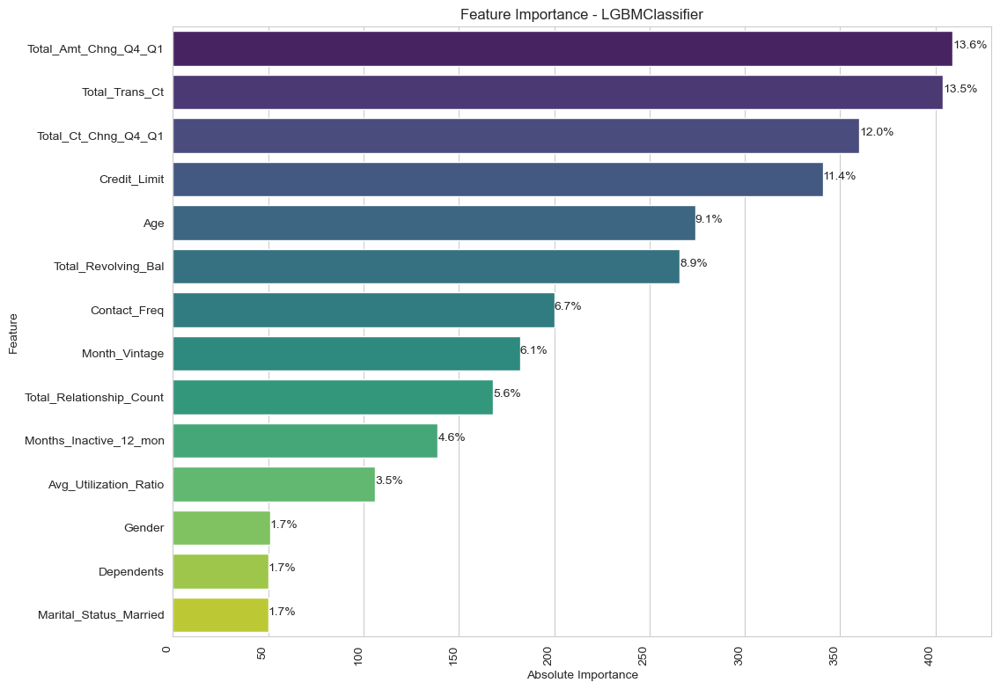

In [146]:
feature_importances = model_2.feature_importances_
feature_names = X_train.columns
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})
feature_importance_df['AbsImportance'] = np.abs(feature_importance_df['Importance'])
feature_importance_df = feature_importance_df.sort_values(by='AbsImportance', ascending=False)



plt.figure(figsize=(12, 9))
ax = sns.barplot(x='AbsImportance', y='Feature', data=feature_importance_df, palette='viridis')
ax.set_xlabel('Absolute Importance')
ax.set_title('Feature Importance - LGBMClassifier')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_width() / feature_importance_df['AbsImportance'].sum())
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height() / 2
    ax.annotate(percentage, (x, y), ha='left')

plt.savefig(os.path.join("Images", "Best-Model-Feature-Importance.png"))
plt.show()

In [125]:
# The importance of the remaining features is comparable to that of the dataset, with no reduction in the number of features.

In [147]:
def plot_confusion_matrix(model_name,y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(8, 6))
    ax = sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu",cbar=False)
    ax.set_xlabel("Predicted Class", fontsize=12)
    ax.set_ylabel("Real Class", fontsize=12)
    ax.set_title(f"Confusion Matrix of {model_name}", fontsize=14)
    plt.savefig(os.path.join("Images", f"{model_name}.png"))
    plt.show()

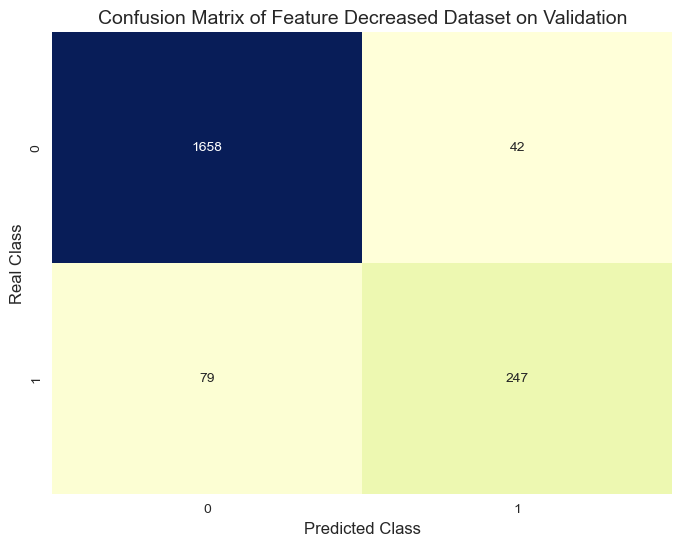

In [148]:
plot_confusion_matrix('Feature Decreased Dataset on Validation',y_val,y_pred)

## __Step 7 - Hyperparameter Tuning__

### _Step 7.1 - Hyperparameter Tuning_

In [152]:
# In the final step of this classification modeling, hyperparameter 
# tuning will be performed

In [153]:
final_df=df_featured_s[above_1]
final_df.head(2)

,Total_Trans_Ct,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1,Credit_Limit,Age,Total_Revolving_Bal,Contact_Freq,Month_Vintage,Total_Relationship_Count,Months_Inactive_12_mon,Avg_Utilization_Ratio,Dependents,Marital_Status_Married,Gender,Churn
id,,,,,,,,,,,,,,,
768805383,-0.973895,2.623494,3.834003,0.446622,-0.165406,-0.473422,0.272727,0.384621,0.763943,-1.327136,0.061,0.503368,1,0,0
818770008,-1.357340,3.563293,12.608573,-0.041367,0.333570,-0.366667,0.181818,1.010715,1.407306,-1.327136,0.105,2.043199,0,1,0


In [154]:
# Let's use lightgbm model, but first train-val-test split.
X=final_df.drop(['Churn'],axis=1).copy()
Y=final_df['Churn'].copy()

In [155]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

In [156]:
model=LGBMClassifier()
model.fit(X_train,y_train)
y_pred = model.predict(X_val)
acc=accuracy_score(y_val, y_pred)
acc

[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1541
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337


0.9402764067127345

In [157]:
y_pred = model.predict(X_train)
acc=accuracy_score(y_train, y_pred)
acc

0.994238683127572

In [140]:
# Grid Search Parameters
param_grid = {
    'num_leaves': [ 50, 80, 100, 120],
    'learning_rate': [0.01, 0.015, 0.1, 0.2, 0.3],
    'n_estimators': [ 100, 200, 300, 400],
    'boosting_type': ['gbdt', 'dart', 'goss']
}

In [141]:
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)
print("En iyi parametreler:", grid_search.best_params_)
print("En iyi skor:", grid_search.best_score_)

[LightGBM] [Info] Number of positive: 781, number of negative: 4079
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1538
[LightGBM] [Info] Number of data points in the train set: 4860, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160700 -> initscore=-1.653032
[LightGBM] [Info] Start training from score -1.653032
[LightGBM] [Info] Number of positive: 781, number of negative: 4079
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1539
[LightGBM] [Info] Number of data points in the train set: 4860, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160700 -> initscore=-1.653032
[LightGBM] [Info] Start training from score -1.653032
[LightGBM] [Info] Nu

In [138]:
best_model

LGBMClassifier(learning_rate=0.2, n_estimators=200, num_leaves=80)

In [143]:
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_val)
acc = accuracy_score(y_val, y_pred)
print("Validation Accuracy:", acc)

[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1541
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337
Validation Accuracy: 0.9402764067127345


### _Step 7.2 - Model Evaluation_

In [149]:
# Let's use lightgbm model, but first train-val-test split.
X=final_df.drop(['Churn'],axis=1).copy()
Y=final_df['Churn'].copy()

In [150]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

[LightGBM] [Info] Number of positive: 976, number of negative: 5099
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1541
[LightGBM] [Info] Number of data points in the train set: 6075, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160658 -> initscore=-1.653337
[LightGBM] [Info] Start training from score -1.653337
Train Accuracy: 1.0
Validation Accuracy: 0.9402764067127345


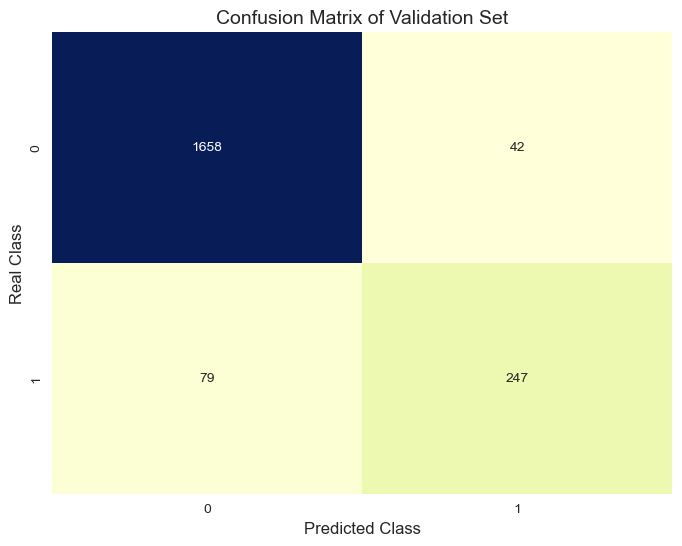

Test Accuracy: 0.9348469891411648


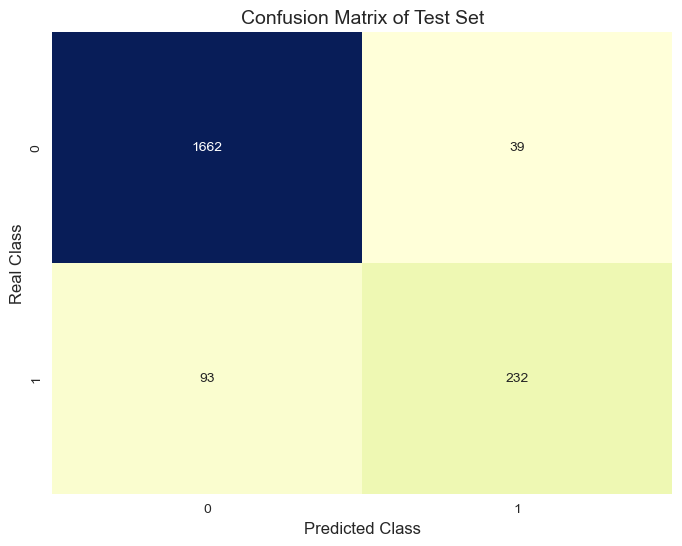

In [158]:
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

y_pred_train = best_model.predict(X_train)
acc_train = accuracy_score(y_train, y_pred_train)

y_pred_val = best_model.predict(X_val)
acc_val = accuracy_score(y_val, y_pred_val)

y_pred_test = best_model.predict(X_test)
acc_test = accuracy_score(y_test, y_pred_test)

print("Train Accuracy:", acc_train)


print("Validation Accuracy:", acc_val)
plot_confusion_matrix('Validation Set',y_val,y_pred_val)

print("Test Accuracy:", acc_test)
plot_confusion_matrix('Test Set',y_test,y_pred_test)


According to the difference between the validation accuracy and train accuracy of lgbm classifier and same results of the reference model:
- It can be said that the bias has been decreased dramatically
- Overfitting problem occured
- F1-score of both Churn and Not Churn and accuracy have increased in the necessary steps of the study.